# 0.0 Imports and directories

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.ensemble import RandomForestRegressor

In [2]:
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))
DATA_DIR = os.path.join(BASE_DIR, 'feature_eng', 'data', 'ft_df.csv')

# 1.0 EDA

In [3]:
df = pd.read_csv(DATA_DIR)

In [4]:
df = df.dropna()

## 1.1 Univariate Analysis

What do we want to look at in this pandas profile?
1.  Variables with a disperse distribution (won't suit this data since it's an ecommerce dataset)
2. Metrics:
    - Min, Max, Range (dispersion)
    - Mean vs Median
    - Std and variance
    - var coef.

In [5]:
profile = ProfileReport(df)
#profile.to_file('output.html')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.2 Bivariate Analysis

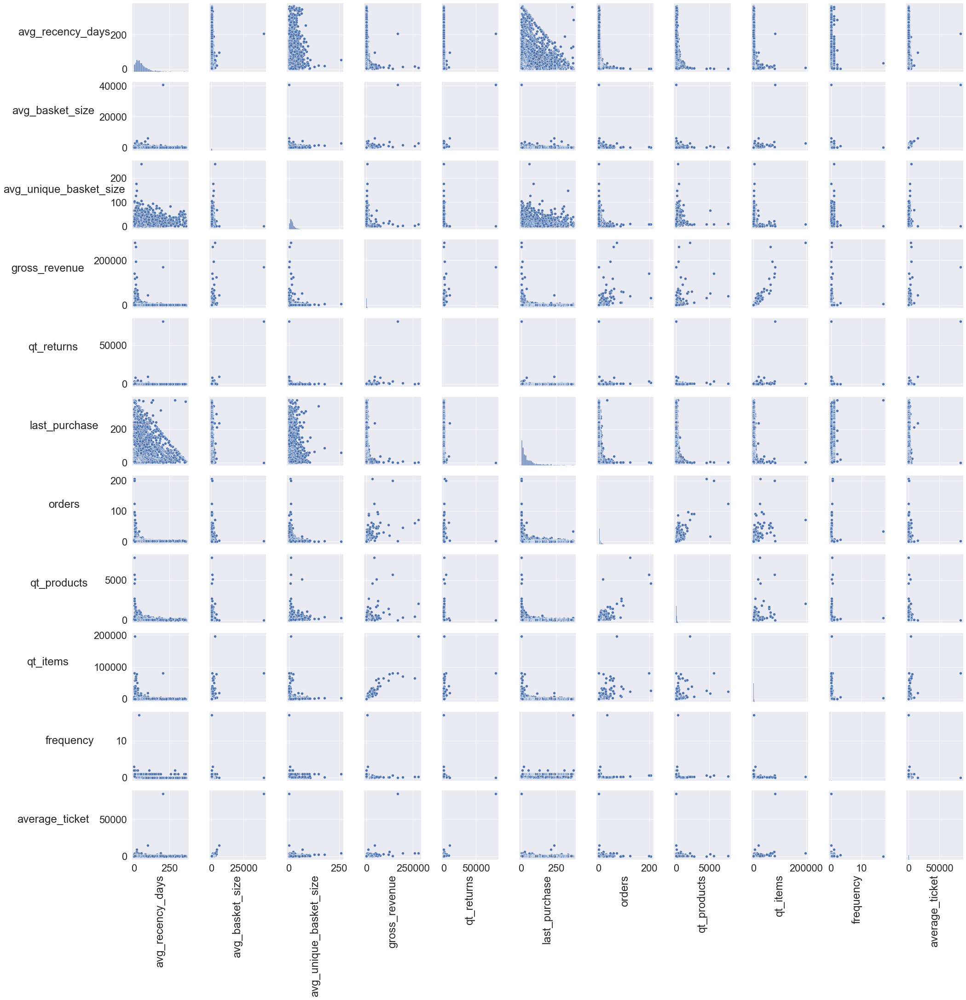

In [6]:
plot_df = df.drop(columns = 'customer_id')

sns.set(rc={'figure.figsize':(100,40)}, font_scale = 2)

g = sns.pairplot(plot_df)
for ax in g.axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.labelpad = 100

# 2.0 Space study

## 2.1 PCA

In [7]:
scaler = MinMaxScaler()
space_df = df.drop(columns = 'customer_id')

In [8]:
for col in space_df.columns:
    space_df[col] = scaler.fit_transform(space_df[[col]])
    
X = space_df.copy()

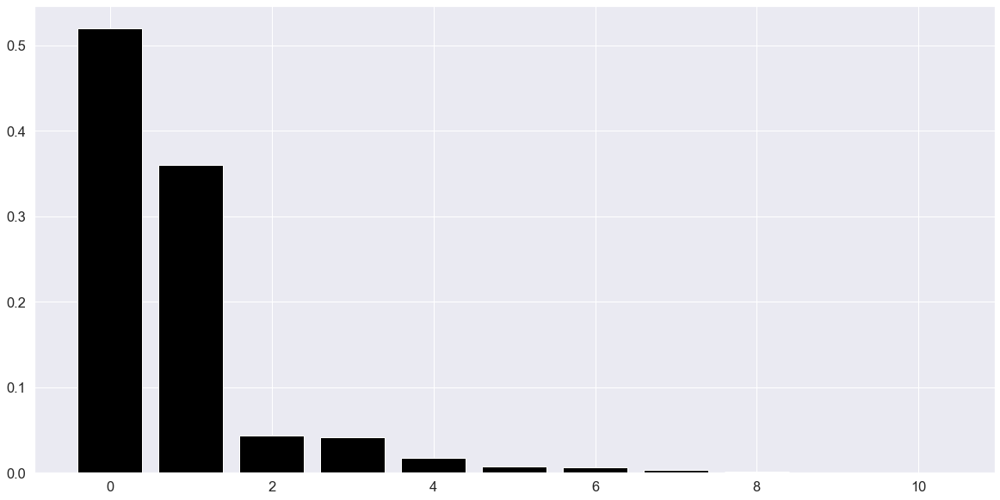

In [9]:
pca = PCA(n_components = X.shape[1])
principal_components = pca.fit_transform(X)

sns.set(rc={'figure.figsize':(20,10)}, font_scale = 1.5)

# plot explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black' )

# pca component
df_pca = pd.DataFrame( principal_components )

In [10]:
df_pca.head()

,0,1,2,3,4,5,6,7,8,9,10
0,0.855559,-0.019169,0.131281,0.095094,-0.097625,0.089167,0.960700,0.017500,0.001946,-0.001293,-0.000464
1,-0.009632,-0.113307,0.015883,-0.010251,-0.006858,0.003680,-0.006155,-0.002088,0.002342,-0.000191,0.000614
2,-0.153641,-0.144965,0.044126,-0.001163,-0.008140,0.002656,-0.000208,-0.008939,-0.004909,0.002187,-0.000050
3,0.074184,0.077473,0.039984,-0.033539,-0.003905,0.000243,-0.005976,-0.002033,0.000695,-0.000407,0.000324
4,0.734609,-0.076117,0.054750,-0.023158,-0.005790,0.000988,-0.028630,-0.000409,0.002131,-0.000998,0.001638


<AxesSubplot:xlabel='0', ylabel='1'>

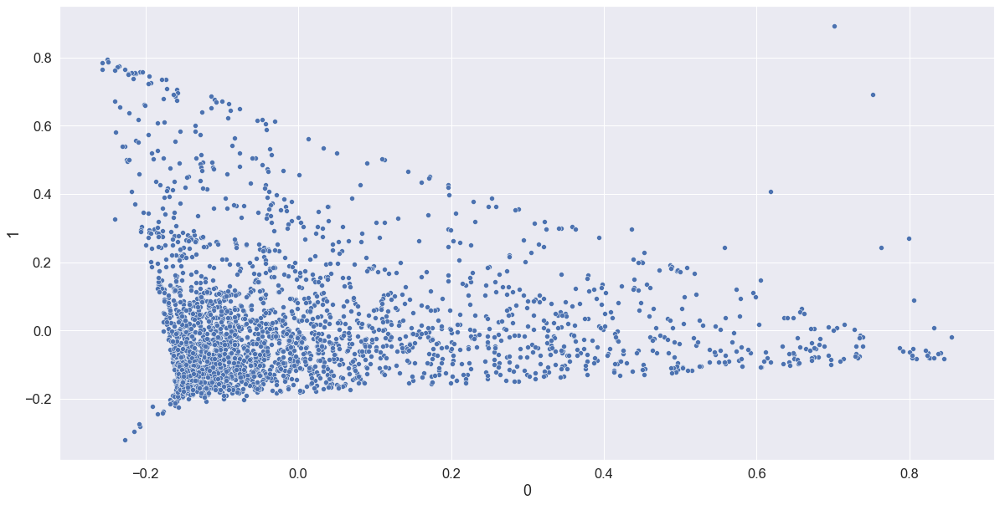

In [11]:
sns.scatterplot(x = 0, y = 1, data = df_pca)


## 2.2 Umap

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

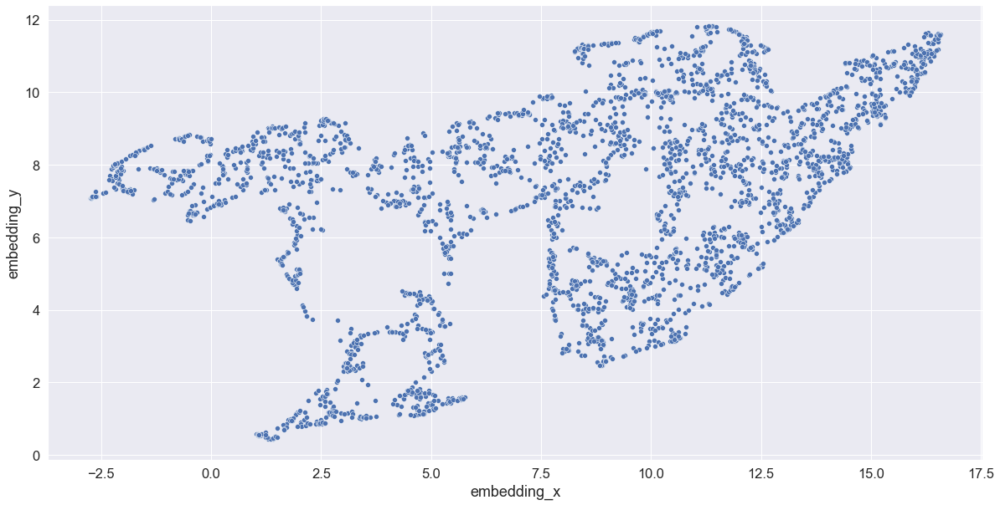

In [12]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

## 2.3 TSNE

<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

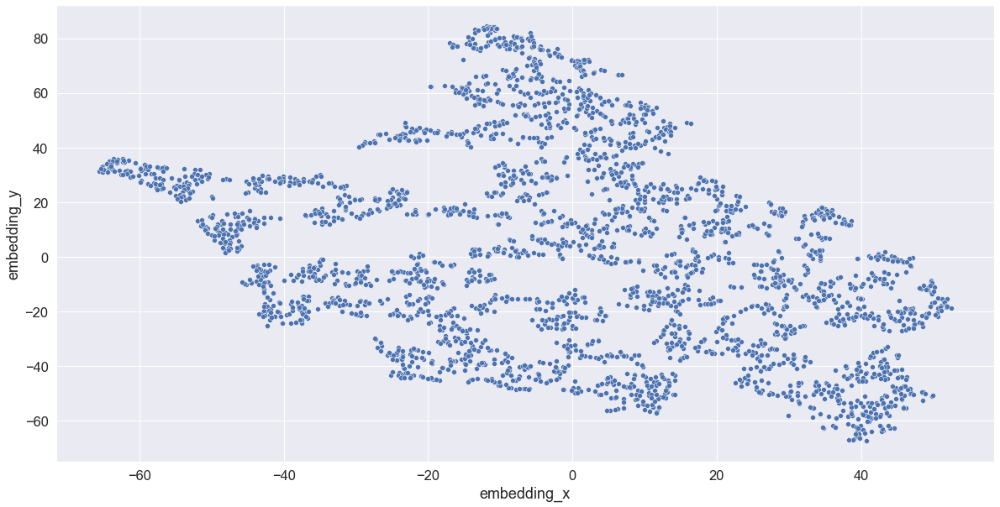

In [13]:
reducer = TSNE(n_components = 2,
                    n_jobs = -1,
                    random_state=42 )

embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]


# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )

## 2.4 Tree-based Embedding

In [14]:
X = df.drop(columns = ['customer_id', 'gross_revenue'])
y = df.gross_revenue

In [15]:
# model definition
rf = RandomForestRegressor( n_estimators=100, random_state=42 )

# model training
rf.fit( X, y )


# Leaf 

# dataframe Leaf

RandomForestRegressor(random_state=42)

In [16]:
df_leaf = pd.DataFrame(rf.apply(X))

In [17]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,2984,2726,3344,3321,2263,3144,3229,3121,3144,3059,...,3249,3217,3214,2790,3181,3076,2948,3359,3339,3311
1,2881,3130,2911,2808,2846,3106,2874,2690,3073,3107,...,2528,2700,2968,2761,3073,3114,2932,2859,2863,2870
2,3485,3611,3591,3571,3607,3641,3546,3533,3695,3598,...,3585,3436,3591,3501,3564,3570,3568,3602,3575,3643
3,2143,1854,1489,1591,1703,1563,2027,1762,2056,2079,...,1535,1451,2068,1992,2029,2180,1295,1085,2052,2096
4,724,715,815,325,369,1029,1202,679,723,559,...,1102,678,664,355,1194,502,914,845,680,317


<AxesSubplot:xlabel='embedding_x', ylabel='embedding_y'>

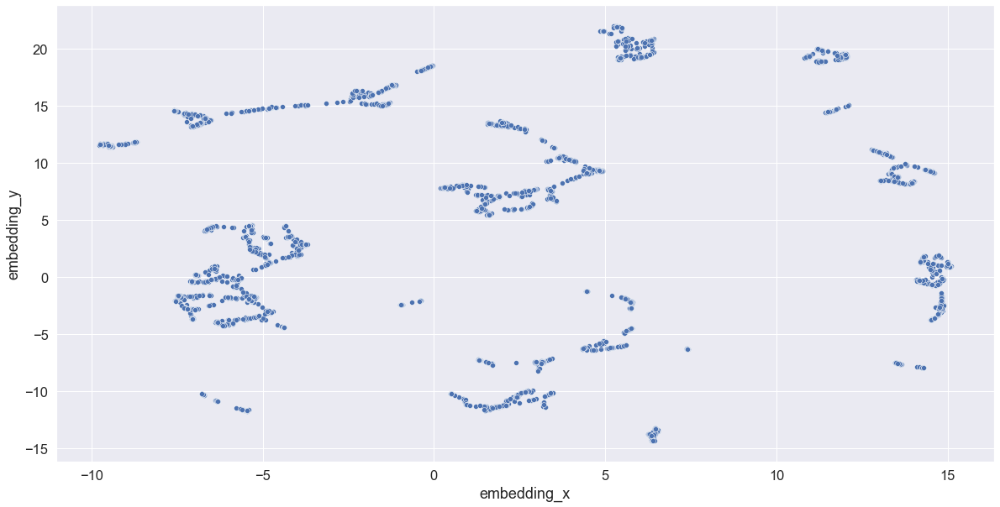

In [18]:
# Reduzer dimensionality
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

# plot UMAP
sns.scatterplot( x='embedding_x', 
                 y='embedding_y', 
                 data=df_pca )